In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2
import pandas
from scipy import ndimage
from PIL import Image 
import PIL 
from math import log10, sqrt
from sklearn.cluster import MiniBatchKMeans
import pandas as pd


In [2]:
def imshow(*args, title=None, figsize=20, to_rgb=True, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    if to_rgb:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    if title is not None:
        assert len(title) == len(images), "Please provide a title for each image."
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(len(images), 1, i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        if images[i-1].ndim == 2:
            plt.imshow(images[i-1], cmap='gray')
        else:
            plt.imshow(images[i-1])
        plt.axis('off')

# 1 . COLOR

## 1.1. COLOR SPACE

### 1.1.1 . Convert Lena to HSV format, and display the H, S, V components as separate grayscale images.

In [11]:
lena = cv2.imread('Lena.bmp')


In [59]:
import numpy as np

def RGB_to_HSV(img):
    r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    r = r / 255.0
    g = g / 255.0
    b = b / 255.0
    
    cmax = np.maximum(np.maximum(r, g), b)
    cmin = np.minimum(np.minimum(r, g), b)
    delta = cmax - cmin
    
    # Calculate hue
    hue = np.zeros_like(r, dtype=np.float64)
    mask_r = (cmax == r)
    mask_g = (cmax == g)
    mask_b = (cmax == b)
    hue = np.where(mask_r, (60 * ((g - b) / delta + 6)) % 360, hue)
    hue = np.where(mask_g, (60 * ((b - r) / delta + 2)) % 360, hue)
    hue = np.where(mask_b, (60 * ((r - g) / delta + 4)) % 360, hue)
    
    # Calculate saturation
    saturation = np.where(cmax == 0, 0, delta / cmax)
    
    # Calculate value
    value = cmax
    
    return [hue, saturation, value]


In [55]:
h, s,v = RGB_to_HSV(lena)

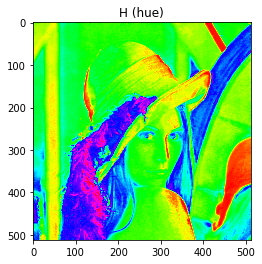

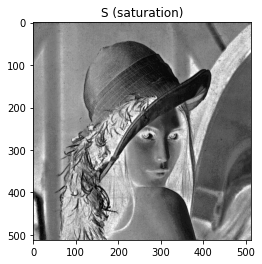

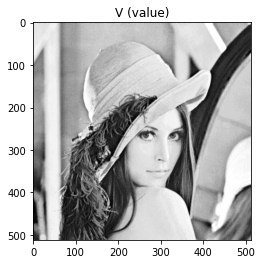

In [19]:
plt.imshow(h,'hsv'),plt.title("H (hue)")
plt.show()
plt.imshow(s,'gray'),plt.title("S (saturation)")
plt.show()
plt.imshow(v,'gray'),plt.title("V (value)")
plt.show()


### 1.1.2. Present Lena in a new color space which was not introduced in class. Then convert R, G and B to the new color space components manually.

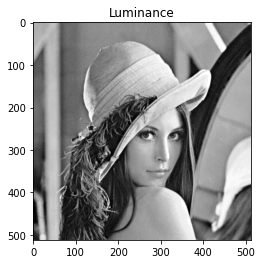

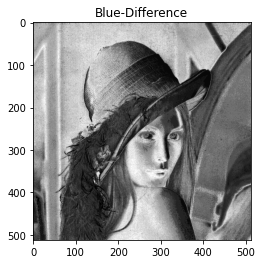

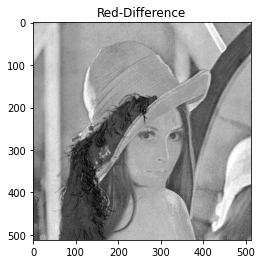

In [23]:
img_yuv = cv2.cvtColor(lena, cv2.COLOR_BGR2YUV)
y, u, v = cv2.split(img_luv)
plt.imshow(y,'gray'),plt.title("Luminance")
plt.show()
plt.imshow(u,'gray'),plt.title("Blue-Difference")
plt.show()
plt.imshow(v,'gray'),plt.title("Red-Difference")
plt.show()

In [24]:
def RGB_to_YUV(img):
    r, g, b = img[:, :, 0], img[:, :, 1], img[:, :, 2]
    
    # Convert RGB to YUV
    y = 0.299 * r + 0.587 * g + 0.114 * b
    u = 0.492 * (b - y)
    v = 0.877 * (r - y)
    
    return [y, u, v]


In [25]:
y, u,v = RGB_to_YUV(lena)

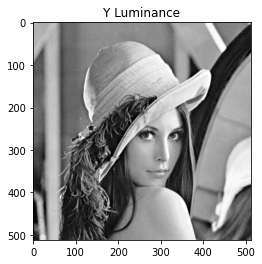

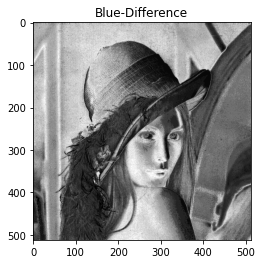

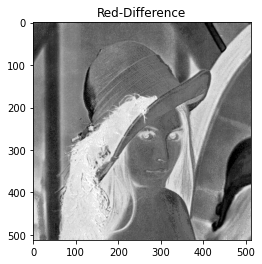

In [48]:
plt.imshow(y, 'gray')
plt.title("Y Luminance")
plt.show()

plt.imshow(u, 'gray')
plt.title("Blue-Difference")
plt.show()

plt.imshow(v, 'gray')
plt.title("Red-Difference")
plt.show()


## 1.2. Quantization

### 1.2.1. We want to weave the Baboon image on a rug. To do so, we need to reduce the number of colors in the image with minimal visual quality loss. If we can have 32, 16 and 8 different colors in the weaving process, reduce the color of the image to these three special modes. Compare using MSE and PSNR and display the results.

In [29]:
baboon = cv2.imread('Baboon.bmp', cv2.IMREAD_UNCHANGED)

In [31]:
def mse(imageA, imageB):
	return np.square(imageA.astype('int16') - 
	                 imageB.astype('int16')).mean()

In [47]:
def psnr(image1, image2):
    mse_val = mse(image1, image2)
    if mse_val == 0:
        return float('inf')
    max_pixel = 255.0
    psnr_val = 20 * np.log10(max_pixel / np.sqrt(mse_val))
    return psnr_val

In [30]:
def quantize_global(x, k):
  k_means = MiniBatchKMeans(k, compute_labels=False)
  k_means.fit(x.reshape(-1, 1))
  labels = k_means.predict(x.reshape(-1, 1))
  q_x = k_means.cluster_centers_[labels]
  q_img = np.uint8(q_x.reshape(x.shape))
  return q_img

C:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


    K        MSE       PSNR
0  32   5.134285  41.026004
1  16  18.258175  35.516230
2   8  74.878675  29.387222


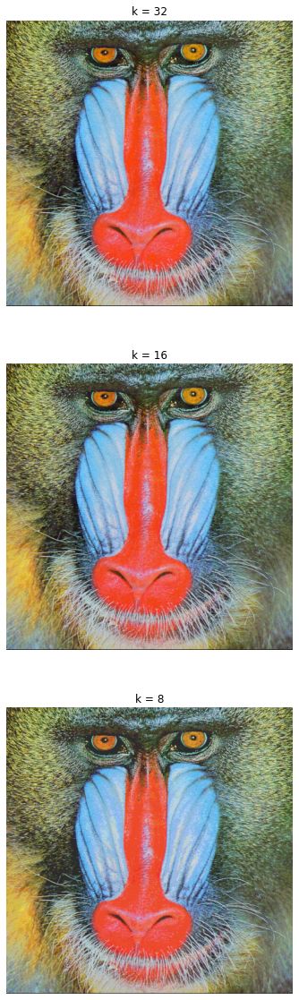

In [39]:
q32 = quantize_global(baboon, 32)
q16 = quantize_global(baboon, 16)
q8 = quantize_global(baboon, 8)

imshow(q32, q16, q8, title=['k = 32', 'k = 16', 'k = 8'], figsize=20)

data = [('32', mse(q32, baboon), psnr(q32, baboon)),
        ('16', mse(q16, baboon), psnr(q16, baboon)),
        ('8', mse(q8, baboon), psnr(q8, baboon))]

df = pd.DataFrame(data, columns=('K', 'MSE', 'PSNR'))
print(df)

# 2. Features

# 2.1. Harris Corner Detector

### 2.1.1. Extract interest points using the Harris Corner detector that you implemented. In this way, apply the Harris Corner detector for at least 4 different scales. Which interest points do you observe to be detected across all these different scales? Notice that your implementation should allow for any suitable scale as input, however you can show results on a minimum of 4 different scales (Test on harris.JPG Image).vvv

In [44]:
def normalize(a):
    if isinstance(a, list):
        return list(map(normalize, a))
    if isinstance(a, tuple):
        return tuple(normalize(list(a)))
    values = (((a - a.min()) / (a.max() - a.min())) * 255)
    values = values.astype('uint8')
    return values

In [95]:
def harris_corners(img, window_size):
    smooth = cv2.GaussianBlur(img,(3,3),0)
    gray = cv2.cvtColor(smooth, cv2.COLOR_BGR2GRAY)
    grad_x =  cv2.Sobel(gray,-1,1,0,ksize = 3)
    grad_y =  cv2.Sobel(gray,-1,0,1,ksize = 3)

    h,w = grad_x.shape
    corners = np.zeros((h,w), dtype = np.float64)
    grad_x = grad_x.astype(np.float64)
    grad_y = grad_y.astype(np.float64)

    grad_xx = grad_x**2
    grad_xx = cv2.GaussianBlur(grad_xx,(3,3),0.5)
    grad_yy = grad_y**2
    grad_yy = cv2.GaussianBlur(grad_yy,(3,3),0.5)
    grad_xy = grad_x *grad_y
    grad_xy = cv2.GaussianBlur(grad_xy, (3,3), 0.5)



    offset = int(window_size/2)
    for i in range(offset, h-offset):
        for j in range(offset, w-offset):
            temp1 = grad_xx[i-offset:i+offset+1, j-offset:j+offset+1]
            temp2 = grad_yy[i-offset:i+offset+1, j-offset:j+offset+1]
            temp3 = grad_xy[i-offset:i+offset+1, j-offset:j+offset+1]
            a = np.sum(temp1)
            b = np.sum(temp2)
            c= np.sum(temp3)
            det  = a*b - (c*c)
            trace = a+b
            R = det - 0.04*(trace**2)
            corners[i,j] = R

    return corners

In [61]:
def draw_corners(corner, img, scale, marker_size):
  y, x = np.nonzero(corner > 0.4 * np.max(corner))
  for i in range(len(x)):
      x1 = int(x[i]); y1 = int(y[i])
      cv2.circle(img, (x1,y1), marker_size ,(0,0,255),-1)

  imshow(img,title=[f'scale = {scale}'], figsize=10)  

In [102]:
def corner_detector(image, i, w_size):
  img1 = image.copy()
  x , y ,channal= img1.shape
  
  img  = cv2.resize(img1, (int(y * i),int(x * i)))
  c = harris_corners(img, w_size)
  draw_corners(c, img, i, int(i*3))

In [103]:
harris = cv2.imread('harris.JPG', cv2.IMREAD_UNCHANGED)

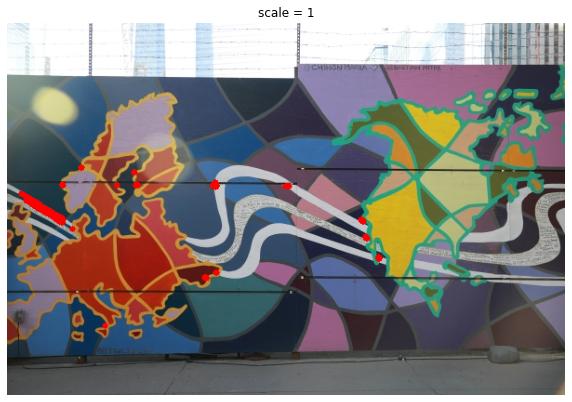

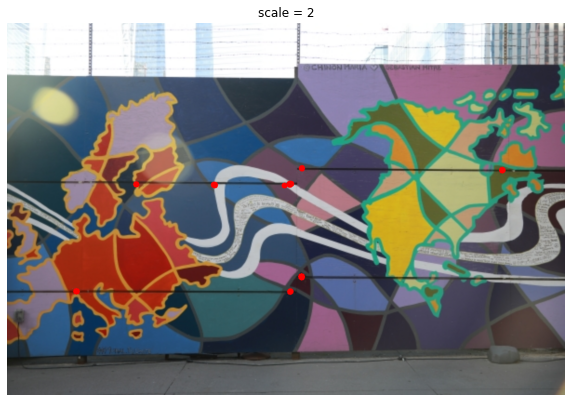

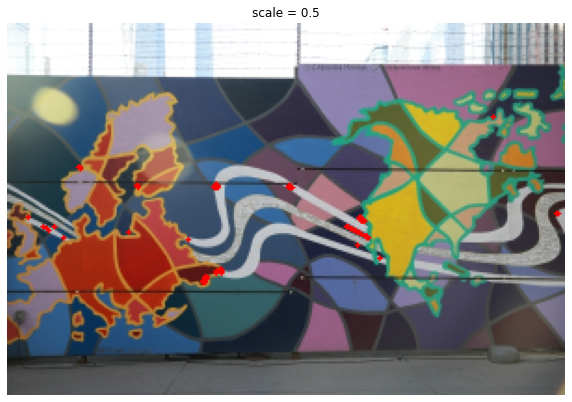

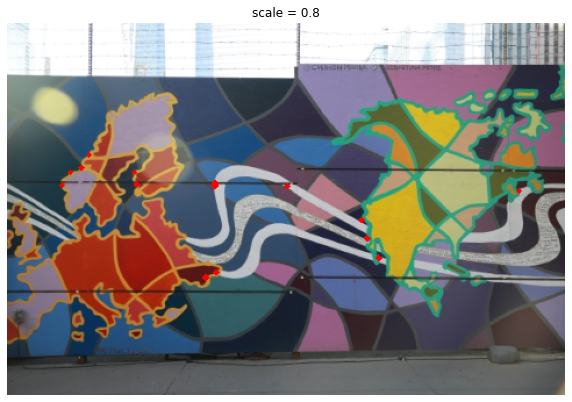

In [104]:
corner_detector(harris, 1, 5)
corner_detector(harris, 2, 5)
corner_detector(harris, 0.5, 3)
corner_detector(harris, 0.8, 3)

## 2.2. Scene stitching with SIFT/SURF features

### 2.2.1. Use the OpenCV implementation of the SIFT or SURF operator to find interest points and establish correspondences between the images. In this case you can directly compare the feature vectors of interest points. You will match and align between different views of a scene with SIFT/SURF features. Discuss results and demonstrates the output of each method separately (Test on sl, sm and sr.jpg images).

In [7]:
import cv2


In [15]:
sl = cv2.imread('sl.jpg', cv2.IMREAD_UNCHANGED)
sm = cv2.imread('sm.jpg', cv2.IMREAD_UNCHANGED)
sr = cv2.imread('sr.jpg', cv2.IMREAD_UNCHANGED)

#### SIFT


In [21]:
def sift(img1, img2, img3):
    sift = cv2.SIFT_create()
    keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(img2, None)
    keypoints3, descriptors3 = sift.detectAndCompute(img3, None)

    bf = cv2.BFMatcher()
    matches12 = bf.knnMatch(descriptors1, descriptors2, k=2)
    matches13 = bf.knnMatch(descriptors1, descriptors3, k=2)
    matches23 = bf.knnMatch(descriptors2, descriptors3, k=2)

    good_matches12 = []
    for m, n in matches12:
        if m.distance < 0.75 * n.distance:
            good_matches12.append(m)

    good_matches13 = []
    for m, n in matches13:
        if m.distance < 0.75 * n.distance:
            good_matches13.append(m)

    good_matches23 = []
    for m, n in matches23:
        if m.distance < 0.75 * n.distance:
            good_matches23.append(m)

    img_matches12 = cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches12, None)
    img_matches13 = cv2.drawMatches(img1, keypoints1, img3, keypoints3, good_matches13, None)
    img_matches23 = cv2.drawMatches(img2, keypoints2, img3, keypoints3, good_matches23, None)

    return img_matches12, img_matches13, img_matches23



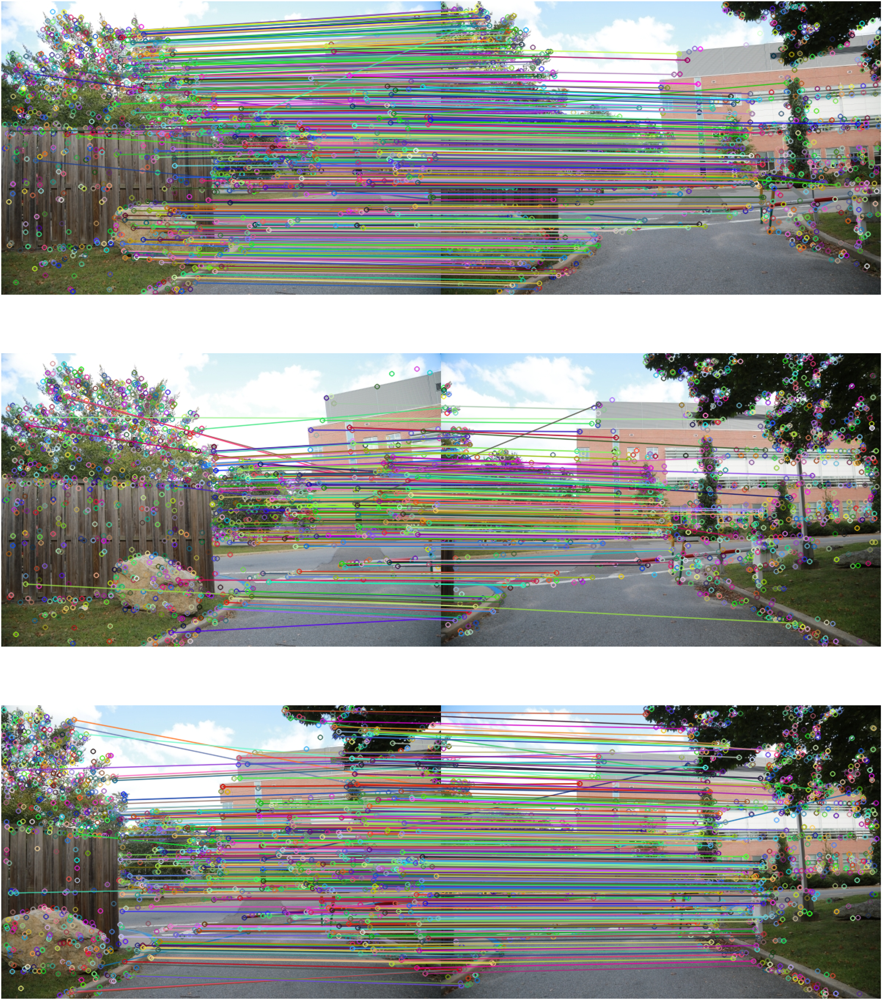

In [22]:
matches = sift(sl,sm,sr)
imshow(matches[0],matches[1], matches[2],figsize=100)

#### SURF

In [37]:
import cv2

def surf(img1, img2, img3):
    # Load the ORB feature detector
    orb = cv2.ORB_create()

    # Detect and compute keypoints and descriptors for the three images
    keypoints1, descriptors1 = orb.detectAndCompute(img1, None)
    keypoints2, descriptors2 = orb.detectAndCompute(img2, None)
    keypoints3, descriptors3 = orb.detectAndCompute(img3, None)

    # Create a brute-force matcher
    bf = cv2.BFMatcher()

    # Perform k-nearest neighbor matching
    matches12 = bf.knnMatch(descriptors1, descriptors2, k=2)
    matches13 = bf.knnMatch(descriptors1, descriptors3, k=2)
    matches23 = bf.knnMatch(descriptors2, descriptors3, k=2)

    # Apply ratio test to filter good matches
    good_matches12 = []
    for m, n in matches12:
        if m.distance < 0.75 * n.distance:
            good_matches12.append(m)

    good_matches13 = []
    for m, n in matches13:
        if m.distance < 0.75 * n.distance:
            good_matches13.append(m)

    good_matches23 = []
    for m, n in matches23:
        if m.distance < 0.75 * n.distance:
            good_matches23.append(m)

    # Draw matches
    img_matches12 = cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches12, None)
    img_matches13 = cv2.drawMatches(img1, keypoints1, img3, keypoints3, good_matches13, None)
    img_matches23 = cv2.drawMatches(img2, keypoints2, img3, keypoints3, good_matches23, None)

    return img_matches12, img_matches13, img_matches23


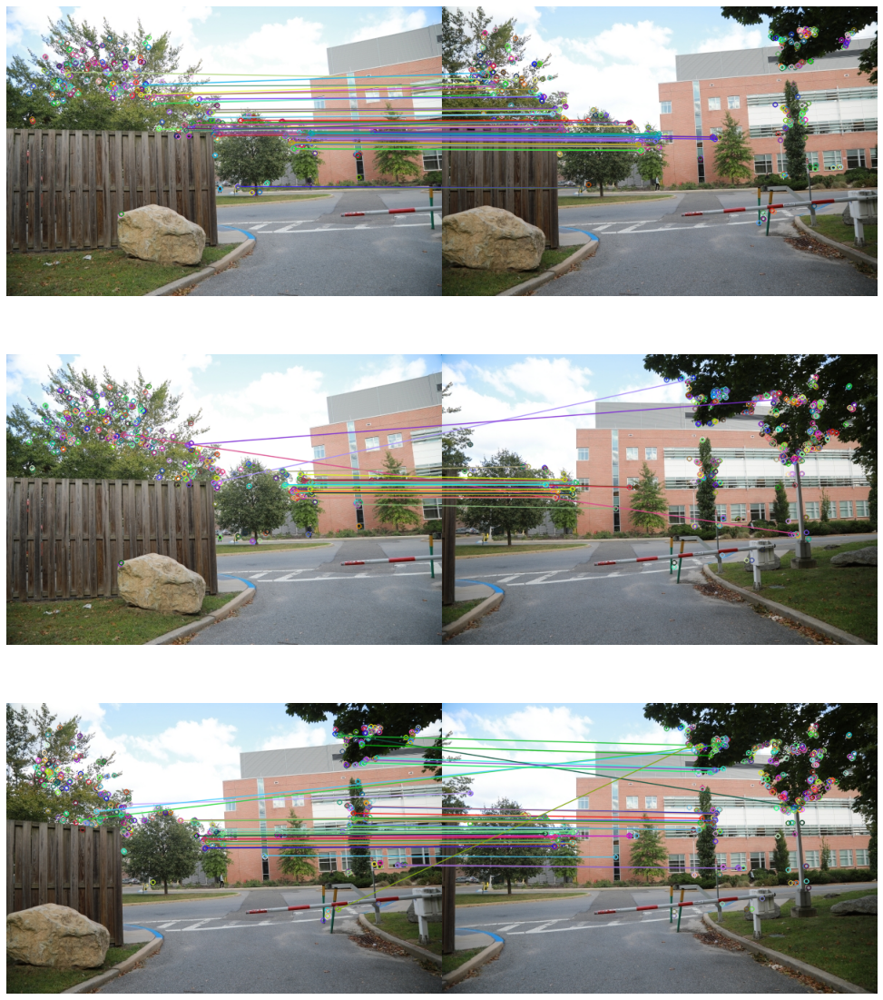

In [38]:
matches = surf(sl, sm, sr)
imshow(matches[0], matches[1], matches[2])
